### **Imports**

In [1]:
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from regression import RegressionModel
from utils import *
from bases import *
from functools import partial
%config InlineBackend.figure_format = 'svg'

In [2]:
plt.rcParams.update({
        'font.family' : 'Times',
        'font.size' : 12,
        'axes.titlesize' : 12,
        'axes.labelsize' : 10,
        'axes.xmargin' : 0,
        'xtick.labelsize' : 10,
        'ytick.labelsize' : 10,
        'legend.fontsize': 10,
        'lines.linewidth': 2,
        'lines.markersize': 3,
        'legend.shadow' : False,
        'legend.framealpha' : 1,
        'legend.fancybox' : True,
        'legend.edgecolor' : 'black',
        'patch.linewidth' : 0.75,
        'legend.handlelength' : 1,
        'text.usetex' : True,
        'text.latex.preamble' : r'''
    \usepackage{amsmath}
    \usepackage{amssymb}
    \usepackage{times}
    \usepackage{bm}
''',
    }) 

### **Initialize Models**

In [3]:
n_models = 20
thetas = torch.linspace(-torch.pi/3, torch.pi/3, n_models)
slopes = torch.tan(thetas)
d, phi = bias_basis()
models = [RegressionModel(d, phi, torch.Tensor([0, m]), 0.05, 0.01) for m in slopes]

In [4]:
fig, axs = plt.subplots(1, n_models, figsize=(20, 1))

for m, theta, ax in zip(models, thetas, axs):
  ax.set_title(f'{float(theta):.2f} rad')
  plot_diversity(m, ax)

### **Plot Heatmaps**

In [5]:
heatmap = calculate_heatmap(models, partial(prior_pred_cross_entropy))

Heatmap done!: 100%|██████████| 400/400 [00:00<00:00, 422.84it/s]       


$$\mathbb{E}_{y \sim p(y|x, M_1)} [p(y|x, M_2)]$$

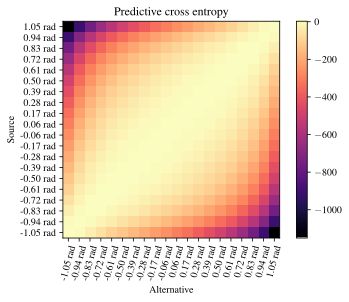

In [6]:
legend = plt.imshow(heatmap, cmap='magma', interpolation='none', origin='lower')
plt.colorbar(legend)
labels = [f'{float(theta):.2f} rad' for theta in thetas]
plt.xticks(ticks=range(n_models), labels=labels, rotation=75)
plt.yticks(ticks=range(n_models), labels=labels)
plt.title('Predictive cross entropy')
plt.ylabel('Source')
plt.xlabel('Alternative')
plt.show()

### **Decomposition**

In [7]:
deg = 16
vars = [taylor_coeff_var(m, deg) for m in models]

In [ ]:
fig, axs = plt.subplots(1, len(models), figsize=(10, 2.25))

for var, name, ax in zip(vars, names, axs):
  ax.set_title(name)
  ax.set_xlabel('Degree')
  ax.bar(range(deg+1), var, color='tomato')
  ax.set_xticks(range(deg+1))
  ax.set_ylim(0, max(0.055, var.max()))
axs[0].set_ylabel('Variance')

plt.show()

